# Deep Learning: Ex.8 - **Object detection**

In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model

import tensorflow_hub as hub  # <---- https://tfhub.dev


# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as lines
from matplotlib.patches import Rectangle
from statistics import mean

---
### 1. Object detection

- Let's pick one of the `Faster R-CNN` models from TF-Hub (the one used in class):
 https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1

- Load and run the model for each of the given images.

- For each image, plot a graph of the detection scores.

- For each image, set a minimal score threshold, and plot the final image with the detected objects (marked with their class name and score).


In [ ]:
def read_label_map(label_map_path):
  item_id = None
  item_name = None
  items = {}
    
  with open(label_map_path, "r") as file:
        for line in file:
          line.replace(" ", "")
          if line == "item{":
            pass
          elif line == "}":
            pass
          elif "id" in line:
            item_id = int(line.split(":", 1)[1].strip())
          elif "display_name" in line:
            item_name = line.split(":", 1)[1].replace("\"", "").strip()

          if item_id is not None and item_name is not None:
            items[item_id] = item_name
            item_id = None
            item_name = None

  return items

# load "mscoco" labels
labels =  read_label_map('mscoco_label_map.pbtxt')

In [ ]:
def objects_detection(img, threshhold,module_handle):
    detector = hub.load(module_handle)
    img = tf.image.decode_jpeg(img, channels=3)

    im = img.numpy()
    im_h, im_w, _ = im.shape

    converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]

    result = detector(converted_img)

    detection_scores = result['detection_scores'].numpy()[0,:]

    plt.plot(detection_scores,'.:')
    plt.grid()


    detection_boxes = result['detection_boxes'].numpy()[0,...]

    #detection_boxes[:10,:]
    detection_classes = result['detection_classes'].numpy().astype(int)[0,:]

    #i = 0
    plt.figure(figsize=(20,16))
    plt.imshow(im)
    for i in range(detection_scores.size):
            if detection_scores[i] > threshhold:
                ymin, xmin, ymax, xmax = detection_boxes[i]
                box_x = xmin * im_w
                box_y = ymin * im_h
                box_w = (xmax-xmin) * im_w
                box_h = (ymax-ymin) * im_h
                ax = plt.gca() # get current Axes

                # Add a Rectangle patch to the Axes
                ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

                txt = "{}: {}%".format(labels[detection_classes[i]], 
                                       int(100 * detection_scores[i]))

                ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')

    plt.show()

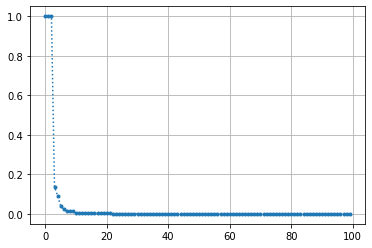

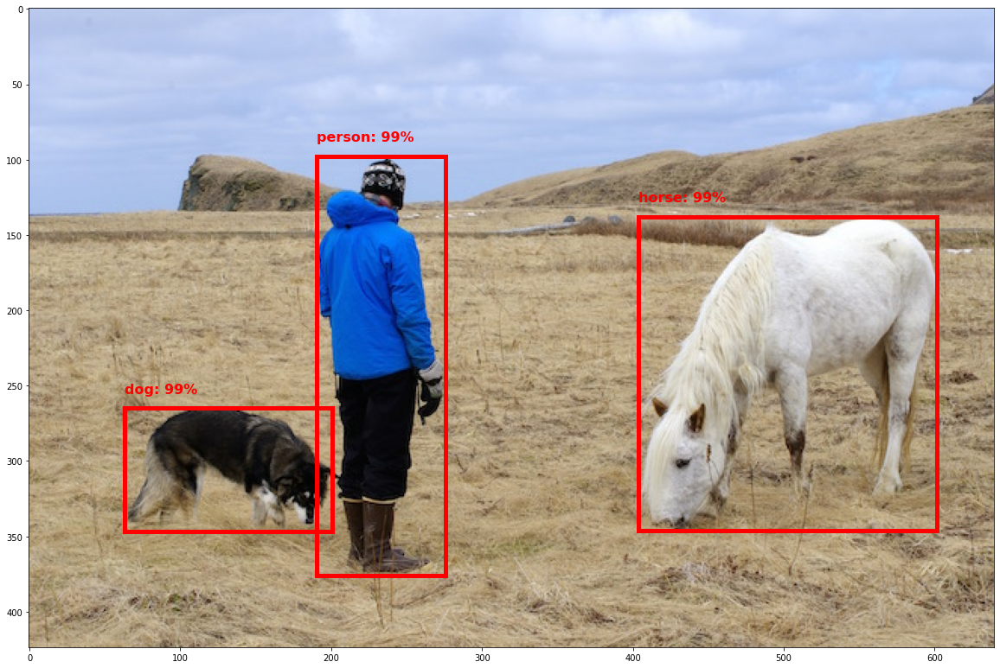

In [ ]:
module = 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1'

img = tf.io.read_file('person.jpg')
objects_detection(img, 0.9, module)

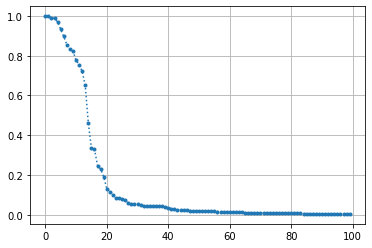

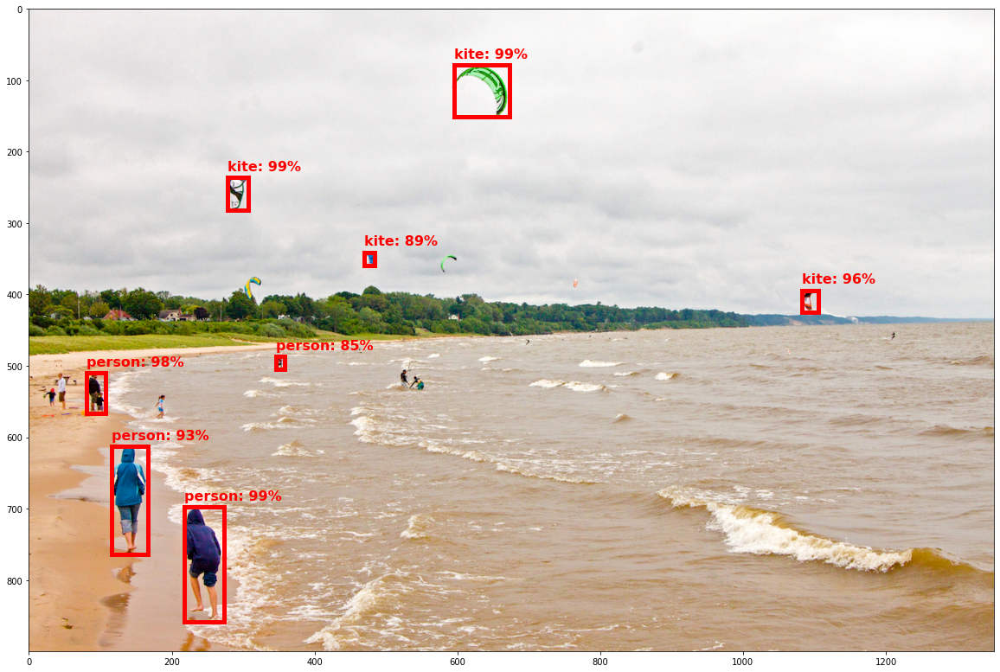

In [ ]:
img = tf.io.read_file('kites.jpg')
objects_detection(img, 0.85,module)

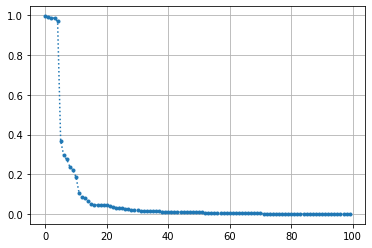

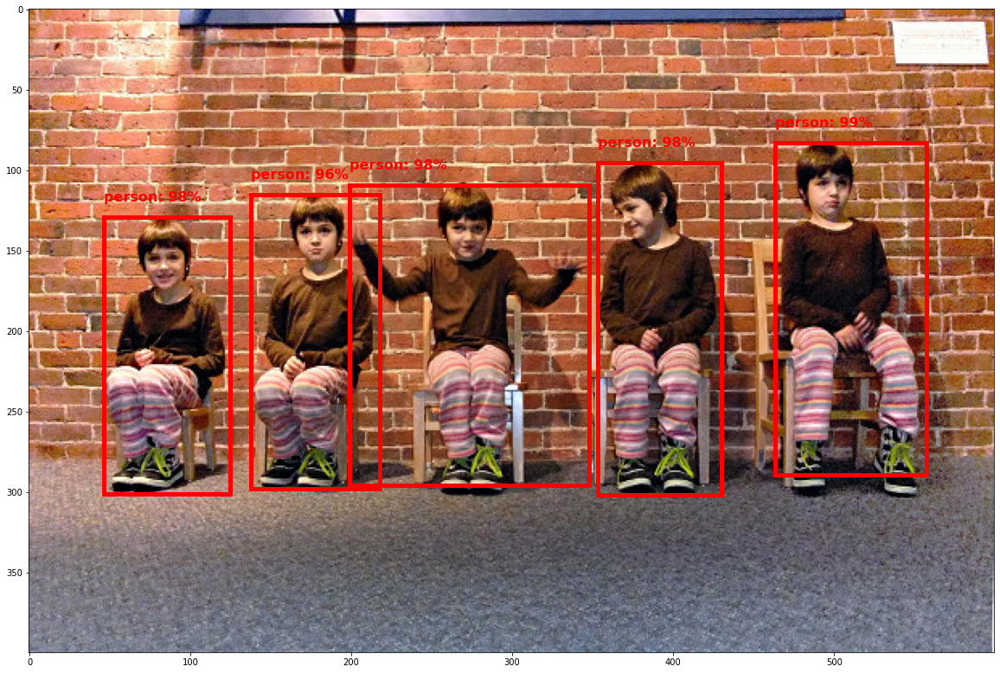

In [ ]:
img = tf.io.read_file('kids.jpg')
objects_detection(img, 0.9 ,module)

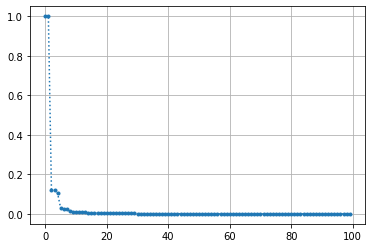

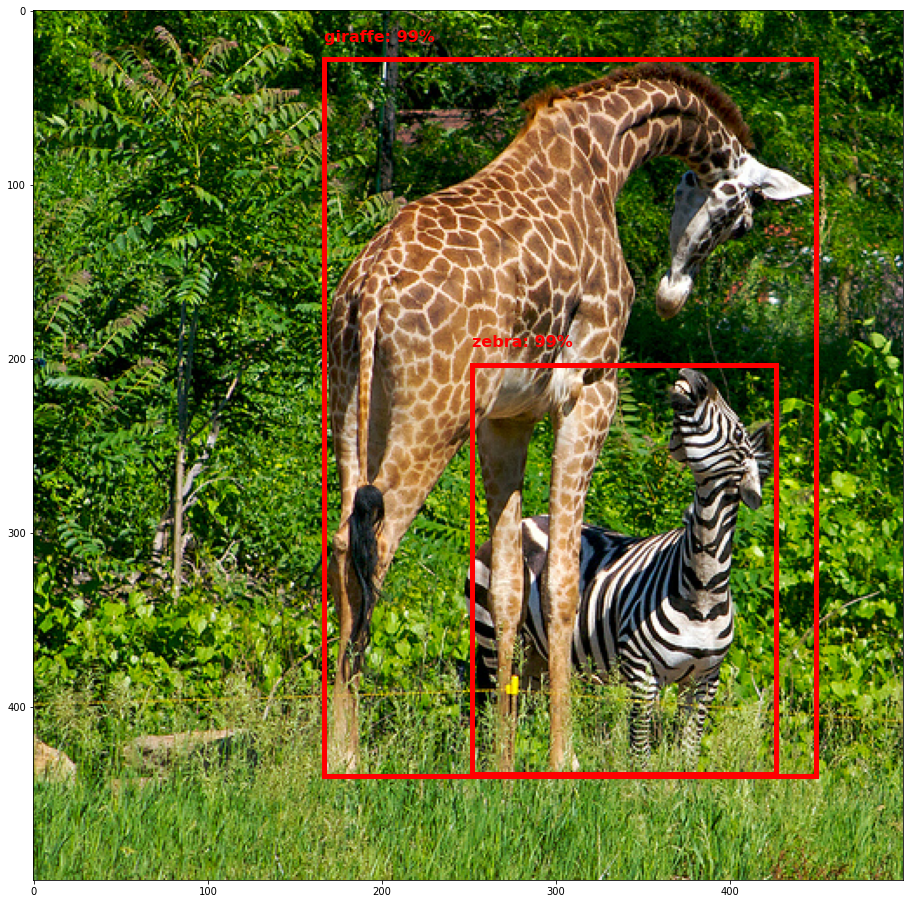

In [ ]:
img = tf.io.read_file('giraffe.jpg')
objects_detection(img, 0.9,module)

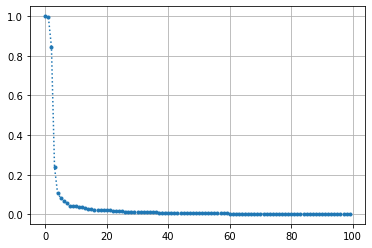

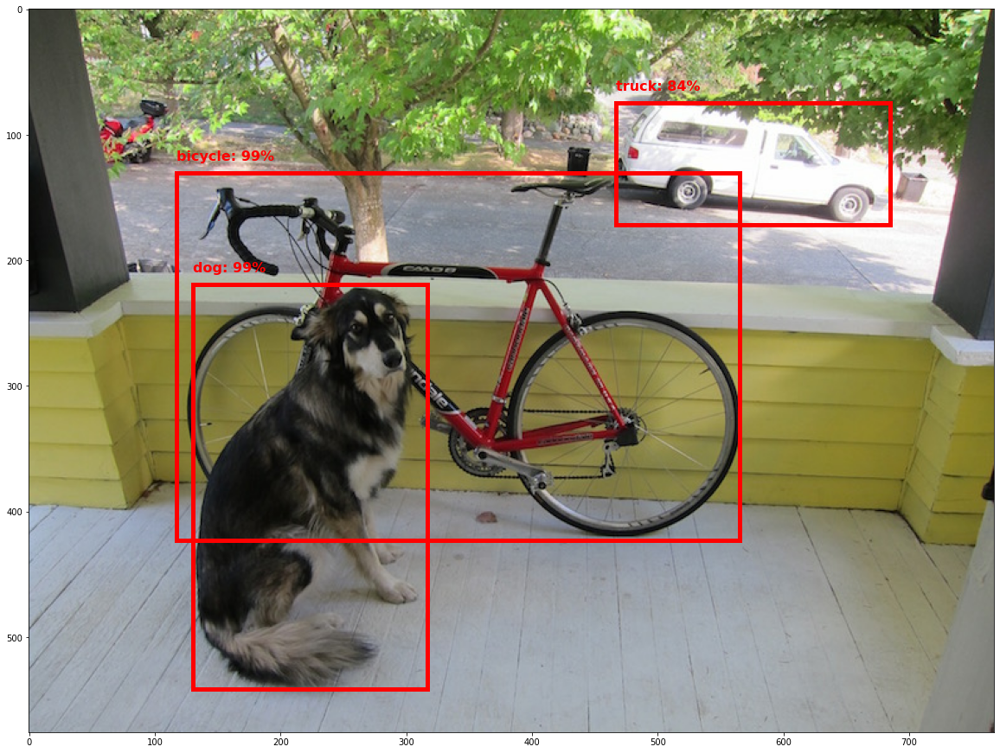

In [ ]:
img = tf.io.read_file('dog.jpg')
objects_detection(img, 0.8, module)

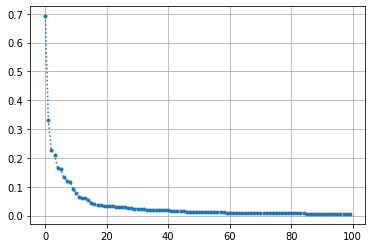

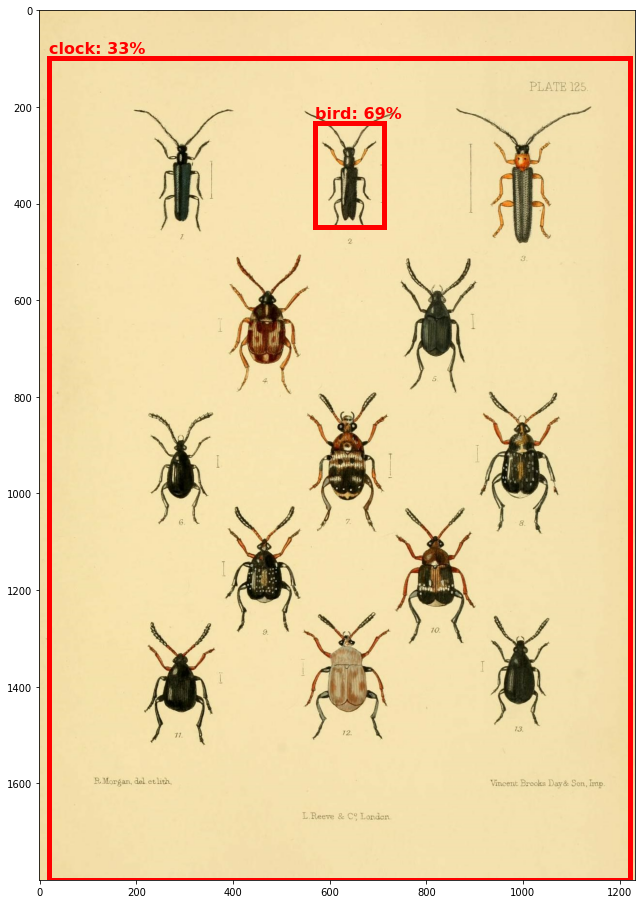

In [ ]:
img = tf.io.read_file('bugs 2.jpg')
objects_detection(img, 0.3, module)

---
### 2. Let's try a different model

As noticed, the 'bugs' image was not labeled correctly, as there is  no 'beetle' class in the MS-COCO dataset.

Let's pick a different model:
https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1

This model was trained over the OpenImagesV4 dataset (1.7M images with 600 object classes).

- Run this model on the 'bugs' image, and display the results.

Note that you can get the detection class names, directly from the model (see the `example use` section in the model's URL).

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


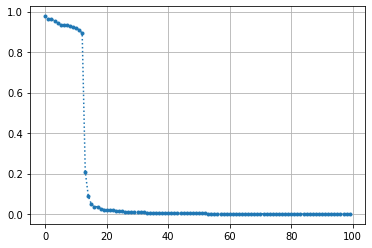

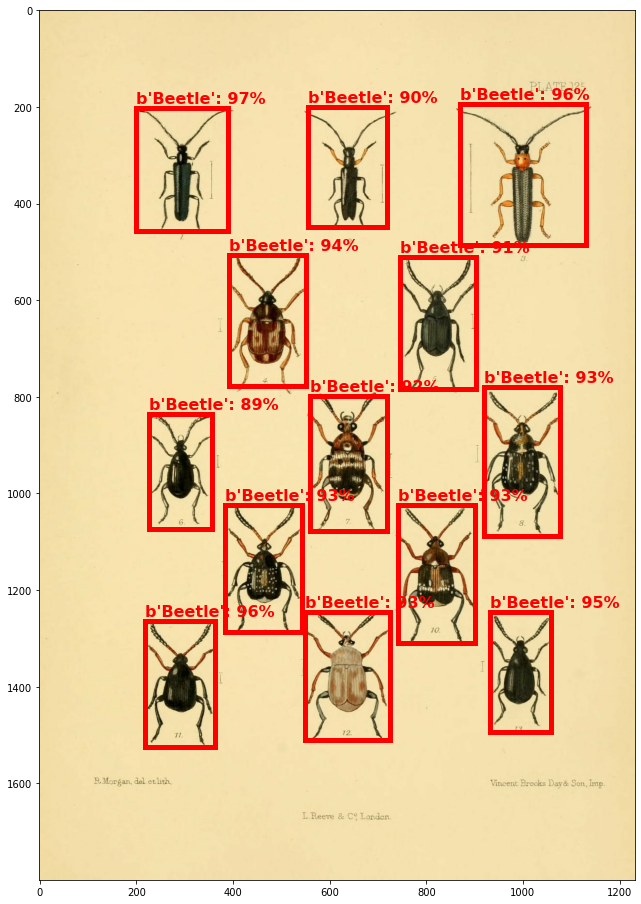

In [ ]:
    ################################
    ###  your code goes here...  ###
    ################################
module = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  
img = tf.io.read_file('bugs 2.jpg')
detector = hub.load(module).signatures['default']
img = tf.image.decode_jpeg(img, channels=3)

im = img.numpy()
im_h, im_w, _ = im.shape

converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
result = detector(converted_img)

detection_scores = result['detection_scores'].numpy()

plt.plot(detection_scores,'.:')
plt.grid()


detection_boxes = result['detection_boxes'].numpy()
#detection_boxes[:10,:]
#.numpy().astype(int)[0,:]
detection_classes = result["detection_class_entities"]
    #i = 0
plt.figure(figsize=(20,16))
plt.imshow(im)
for i in range(detection_scores.size):
  if detection_scores[i] > 0.8:
        box_x = detection_boxes[i,1] * im_w
        box_y = detection_boxes[i,0] * im_h
        box_w = (detection_boxes[i,3]-detection_boxes[i,1]) * im_w
        box_h = (detection_boxes[i,2]-detection_boxes[i,0]) * im_h
        ax = plt.gca() # get current Axes

                # Add a Rectangle patch to the Axes
        ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

        txt = "{}: {}%".format(detection_classes[i], int(100 * detection_scores[i]))

        ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')

plt.show()

---
### 3. Keypoints detection

Some of the models, trained on the MS-COCO datasets, include not only the bounding boxes of the objects, but also a set of 17 keypoints for each of the persons detected in the image (e.g., elbows, head, knees, hands, etc...).

Pick one such model, e.g:
https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1

As noted in the URL, these 17 keypoints are returned as:

`detection_keypoints: a tf.float32 tensor of shape [1, N, 17, 2] containing the detected keypoints.`

- For each person detected in the image, plot its 17 keypoints. In addition, draw the "skeleton" for each person, by connecting the lines between the keypoints. Use the provided mapping: `COCO17_HUMAN_POSE_KEYPOINTS`. For example: `COCO17_HUMAN_POSE_KEYPOINTS[0] = (0,1)` means that you need to draw a line between keypoint 0 to keypoint 1.

- Run the model and display the results, for all the images containing any persons.


In [ ]:
COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [ ]:
def objects_detection_with_skeleton(img, threshhold):
  module = 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1'
  detector = hub.load(module)
  img = tf.image.decode_jpeg(img, channels=3)

  im = img.numpy()
  im_h, im_w, _ = im.shape

  converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]

  result = detector(converted_img)

  detection_scores = result['detection_scores'].numpy()[0,:]

  plt.plot(detection_scores,'.:')
  plt.grid()


  detection_boxes = result['detection_boxes'].numpy()[0,...]

  detection_classes = result['detection_classes'].numpy().astype(int)[0,:]

  #i = 0
  plt.figure(figsize=(20,16))
  plt.imshow(im)
  for i in range(detection_scores.size):
          if detection_scores[i] > threshhold:
              ymin, xmin, ymax, xmax = detection_boxes[i]
              box_x = xmin * im_w
              box_y = ymin * im_h
              box_w = (xmax-xmin) * im_w
              box_h = (ymax-ymin) * im_h
              ax = plt.gca() # get current Axes
              detection_label = labels[detection_classes[i]]
              if detection_label == 'person':
                if mean(result['detection_keypoint_scores'].numpy()[0,i,...]) > 0.4:
                  points = result['detection_keypoints'][0,i,...]
                  for points_to_connect in COCO17_HUMAN_POSE_KEYPOINTS:
                      point_one = points[points_to_connect[0]]
                      point_two = points[points_to_connect[1]]
                      xdata = [point_one[1]*im_w,point_two[1]*im_w]
                      ydata = [point_one[0]*im_h,point_two[0]*im_h]
                      line = lines.Line2D(xdata,ydata,color='y')
                      ax.add_line(line)
                      for point in points:
                        plt.plot(point[1]*im_w,point[0]*im_h,'.:',markersize=10,color='y')
              # Add a Rectangle patch to the Axes
              ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))


              txt = "{}: {}%".format(detection_label, int(100 * detection_scores[i]))

              ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')

  plt.show()

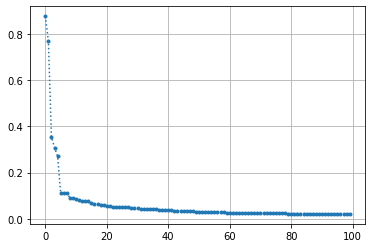

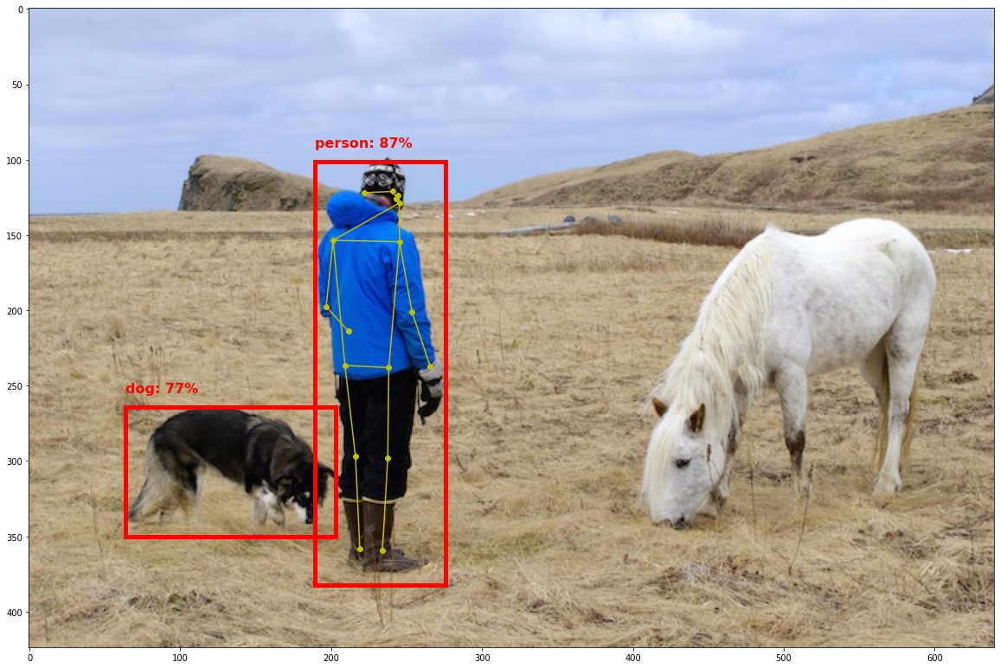

In [ ]:

img = tf.io.read_file('person.jpg')
objects_detection_with_skeleton(img, 0.75)

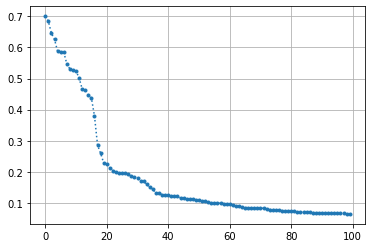

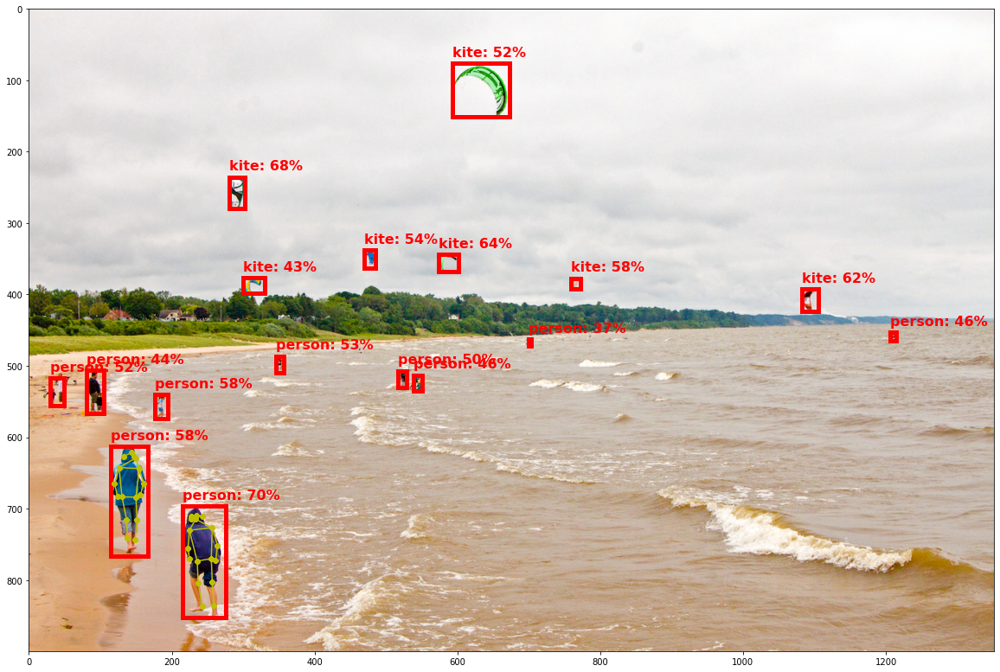

In [ ]:
img = tf.io.read_file('kites.jpg')
objects_detection_with_skeleton(img, 0.35)

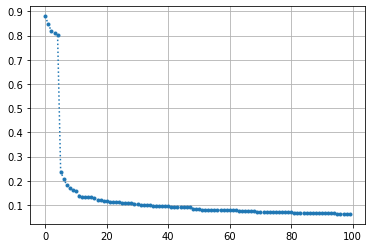

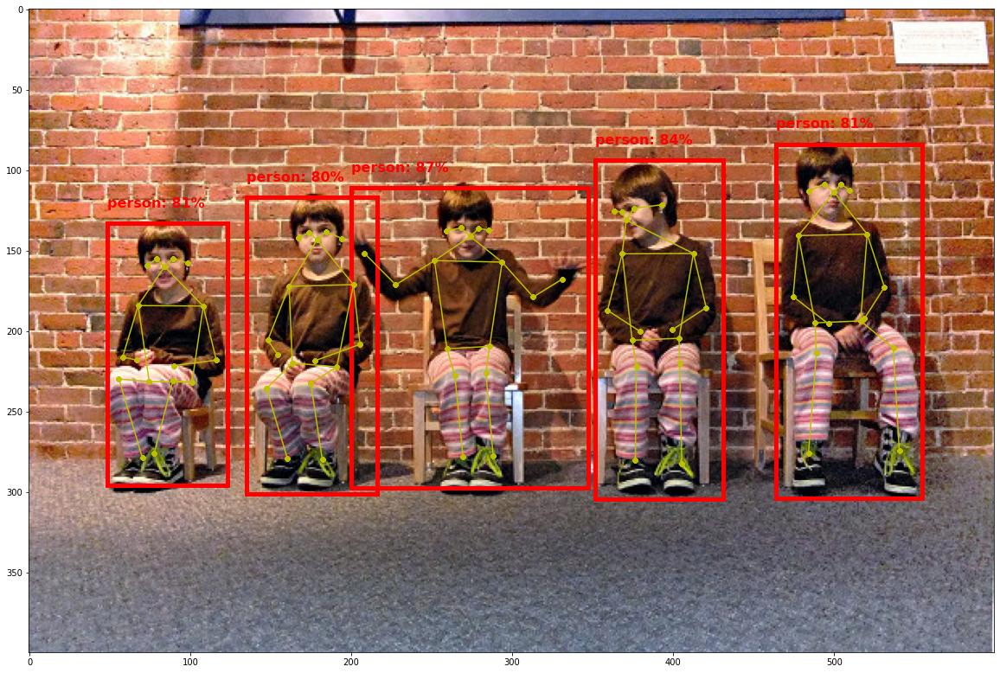

In [ ]:
img = tf.io.read_file('kids.jpg')
objects_detection_with_skeleton(img, 0.585)